In [93]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
import ast
import shap
from tqdm import tqdm
import folium
from folium.plugins import HeatMap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.neighbors import KNeighborsRegressor
import geopandas as gpd
from scipy.spatial import ConvexHull, Delaunay
import matplotlib.tri as tri
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import KFold
from sklearn.neighbors import KernelDensity
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable, get_cmap
from xgboost import XGBRegressor
from sklearn.metrics import median_absolute_error
from statsmodels.tsa.ar_model import AutoReg
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score, cross_val_predict
from scipy.stats import randint
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
df_prod = pd.read_csv('Downloads/Petro Data Analysis Stuff/ML Datasheets/production_data.csv')
df_geo = pd.read_csv('Downloads/Petro Data Analysis Stuff/ML Datasheets/geo_data.csv')
df_comp = pd.read_csv('Downloads/Petro Data Analysis Stuff/ML Datasheets/completion_data_2.csv')
df_parent_child = pd.read_csv('Downloads/Petro Data Analysis Stuff/ML Datasheets/parent_child_data.csv')

In [3]:
df_geo_api = list(df_geo['API'].unique())
df_comp_api = list(df_comp['API'].unique())
df_parent_child_api = list(df_parent_child['API'].unique())

In [4]:
inclusive_apis = list(df_prod[(df_prod['API'].isin(df_parent_child_api)) & (df_prod['API'].isin(df_comp_api)) & (df_prod['API'].isin(df_geo_api))]['API'])

In [5]:
df_parent_child = df_parent_child[df_parent_child['Well Type'] == 'Child']
df_parent_child = df_parent_child.drop_duplicates(subset='API', keep='first')

In [6]:
df_prod = df_prod.drop(columns=['Unnamed: 0'])
df_geo = df_geo.drop(columns=['Unnamed: 0'])
df_comp = df_comp.drop(columns=['Unnamed: 0'])
df_parent_child = df_parent_child.drop(columns=['Unnamed: 0'])

In [7]:
def convert_to_list(literal):
    return ast.literal_eval(literal) if isinstance(literal, str) else literal
def sum_first_n(liquids, n):
    return sum(liquids[:n])
df_prod['Liquid_List'] = df_prod['Liquid_List'].apply(convert_to_list)
df_prod['Gas_List'] = df_prod['Gas_List'].apply(convert_to_list)

In [8]:
n = 1000
df_prod[f'Liquid_Prod_{n}_Month'] = df_prod['Liquid_List'].apply(lambda x: sum_first_n(x, n))
df_prod[f'Gas_Prod_{n}_Month'] = df_prod['Gas_List'].apply(lambda x: sum_first_n(x, n))

In [9]:
df_prod = df_prod[['API', f'Liquid_Prod_{n}_Month', f'Gas_Prod_{n}_Month', 'Gas_List', 'Operator']]

In [10]:
df_1 = pd.merge(df_prod, df_geo, on='API', how='inner')
df_2 = pd.merge(df_1, df_comp, on='API', how='inner')
df = pd.merge(df_2, df_parent_child, on='API', how='inner')
df = df.drop(columns=['Well Type'])

In [11]:
def median_absolute_percent_error(y_true, y_pred):
    return np.median(np.abs((y_true - y_pred) / y_true)) * 100

In [12]:
df[f'Liquid_Prod_{n}_Month / ft'] = df[f'Liquid_Prod_{n}_Month'] / df['Lat Len Gross Perf Intvl']
df[f'Gas_Prod_{n}_Month / ft'] = df[f'Gas_Prod_{n}_Month'] / df['Lat Len Gross Perf Intvl']

In [13]:
top_efficient_operators = ['PRIMEXX OPERATING CORP', 'PRI OPERATING LLC',
'EOG RESOURCES INC',
'RESOLUTE NATURAL RESOURCES CO LLC',
'COG OPERATING LLC',
'MATADOR PRODUCTION CO',
'CHEVRON U S A INC',
'OXY USA WTP LP',
'NOBLE ENERGY INC',
'COLGATE OPERATING LLC']

richest_operators = ['EOG RESOURCES INC', 'CHEVRON U S A INC', 'OXY USA INC', 'DIAMONDBACK EXPLORATION & PROD LLC',
                    'CONOCOPHILLIPS CO', 'ENDEAVOR ENERGY RESOURCES LP', 'XTO ENERGY INC', 'OXY USA WTP LP']

df['Top Operator'] = df['Operator'].isin(top_efficient_operators).astype(int)
df['Rich Operator'] = df['Operator'].isin(richest_operators).astype(int)

In [14]:
X = df.drop(columns=['API', 'Operator', f'Liquid_Prod_{n}_Month', f'Liquid_Prod_{n}_Month / ft', f'Gas_Prod_{n}_Month', f'Gas_Prod_{n}_Month / ft', 'Gas_List', 'Before Child Liquid Normalized', 'Before Child Gas Normalized', 'Surface Latitude', 'Surface Longitude'])
y = df[f'Gas_Prod_{n}_Month']
X_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()
X_normalized = X_scaler.fit_transform(X)
y_normalized = y_scaler.fit_transform(y.to_numpy().reshape(-1, 1))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Testing a 'bad' model (using the mean for all values)

In [15]:
y_pred = [y_train.mean()] * len(y_test)

In [16]:
r2 = r2_score(y_test, y_pred)
mdape = median_absolute_percent_error(y_test, y_pred)
median_squared_error = np.median((y_test - y_pred) ** 2)
rmdse = np.sqrt(median_squared_error)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"R^2 Score: {r2:.5f}")
print(f"MDAPE: {mdape:.5f}")
print(f"RMDSE: {rmdse:.5f}")
print(f'MAPE: {mape:.4f}')

R^2 Score: -0.01199
MDAPE: 62.32150
RMDSE: 548654.81410
MAPE: 1.0981


### Testing Random Forest Ensemble

In [17]:
# Define the base models
base_models = [
    ('et1', ExtraTreesRegressor(random_state=1)),
    ('et2', ExtraTreesRegressor(random_state=2)),
    ('et3', ExtraTreesRegressor(random_state=3))
]

# Define the meta-model
meta_model = LinearRegression()

# Create the stacking ensemble
stacking_ensemble = StackingRegressor(estimators=base_models, final_estimator=meta_model)

# Train the stacking ensemble
stacking_ensemble.fit(X_train, y_train)

y_pred_stack = stacking_ensemble.predict(X_test)

In [18]:
r2 = r2_score(y_test, y_pred_stack)
mdape = median_absolute_percent_error(y_test, y_pred_stack)
median_squared_error = np.median((y_test - y_pred_stack) ** 2)
rmdse = np.sqrt(median_squared_error)
mape = mean_absolute_percentage_error(y_test, y_pred_stack)

print(f"R^2 Score: {r2:.5f}")
print(f"MDAPE: {mdape:.5f}")
print(f"RMDSE: {rmdse:.5f}")
print(f'MAPE: {mape:.4f}')

R^2 Score: 0.79996
MDAPE: 23.49786
RMDSE: 186601.67668
MAPE: 0.4158


In [19]:
model = ExtraTreesRegressor(random_state=40)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mdape = median_absolute_percent_error(y_test, y_pred)
median_squared_error = np.median((y_test - y_pred) ** 2)
rmdse = np.sqrt(median_squared_error)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"R^2 Score: {r2:.5f}")
print(f"MDAPE: {mdape:.5f}")
print(f"RMDSE: {rmdse:.5f}")
print(f'MAPE: {mape:.4f}')

R^2 Score: 0.78394
MDAPE: 24.51368
RMDSE: 209604.01068
MAPE: 0.4704


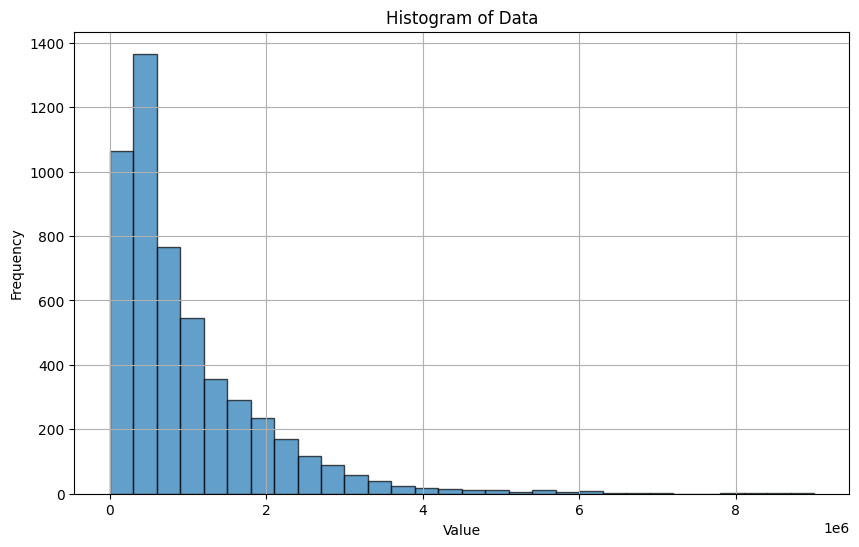

In [20]:
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.hist(df_prod[f'Gas_Prod_{n}_Month'], bins=30, edgecolor='black', alpha=0.7)  # Adjust bins for better resolution
plt.title('Histogram of Data')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [21]:
df_prod[f'Gas_Prod_{n}_Month'].describe()

count    5.209000e+03
mean     9.883057e+05
std      9.591305e+05
min      0.000000e+00
25%      3.404020e+05
50%      6.593160e+05
75%      1.340763e+06
max      9.004415e+06
Name: Gas_Prod_1000_Month, dtype: float64

In [22]:
mape_values = np.abs((y_test - y_pred_stack) / y_test) * 100
mape_df = pd.DataFrame({'MAPE': mape_values})
print(f'Percent of wells with less than 20% absolute error: {len(mape_df[mape_df["MAPE"] < 20]) * 100 / len(y_test)}')

Percent of wells with less than 20% absolute error: 43.53448275862069


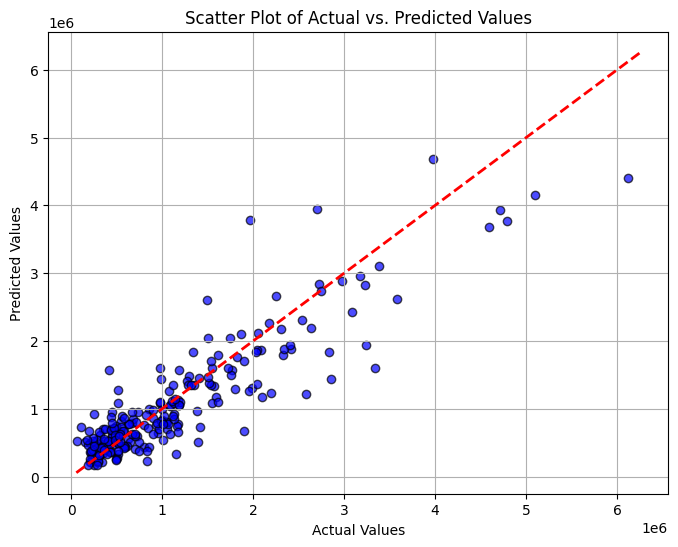

In [23]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_stack, color='blue', edgecolor='k', alpha=0.7)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)  # Diagonal line for reference
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs. Predicted Values')
plt.grid(True)
plt.show()

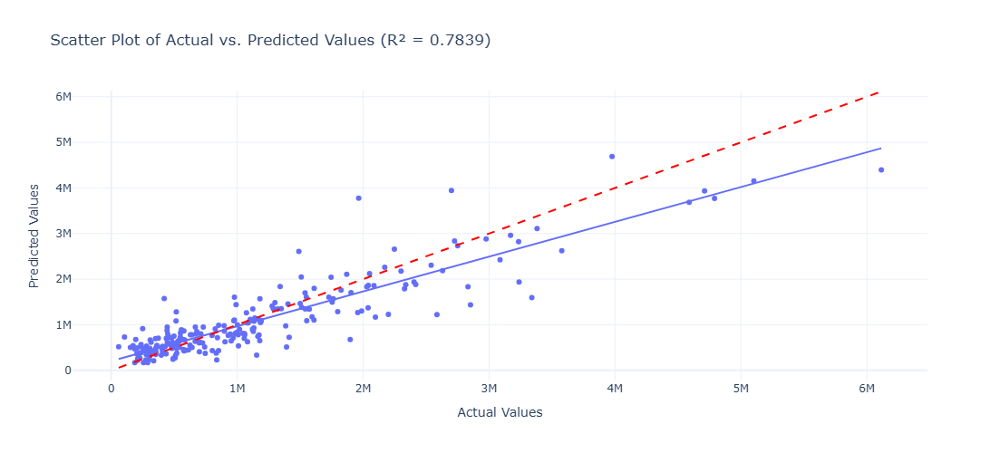

In [24]:
plot_data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_stack})

fig = px.scatter(
    plot_data, 
    x='Actual', 
    y='Predicted',
    title=f'Scatter Plot of Actual vs. Predicted Values (R² = {r2:.4f})',
    labels={'Actual': 'Actual Values', 'Predicted': 'Predicted Values'},
    trendline='ols',  # Optional: Adds a trendline (best-fit line)
    template='plotly_white'  # Optional: Use a white background for better clarity
)

fig.add_shape(
    type='line',
    x0=min(y_test),
    y0=min(y_test),
    x1=max(y_test),
    y1=max(y_test),
    line=dict(color='red', width=2, dash='dash'),
    name='y=x Line'
)

# Update layout to set figure size
fig.update_layout(
    width=800,  # Set the width of the figure
    height=500  # Set the height of the figure
)
fig.show()

In [25]:
slope, intercept = np.polyfit(y_pred_stack, y_test, 1)
fit_line = slope * y_pred_stack + intercept

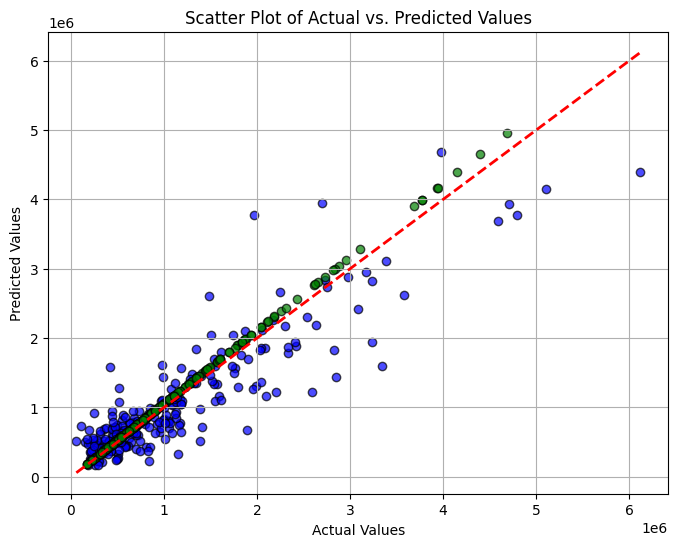

In [26]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_stack, color='blue', edgecolor='k', alpha=0.7)
plt.scatter(y_pred_stack, fit_line, color='g', edgecolor='k', alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Diagonal line for reference
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs. Predicted Values')
plt.grid(True)
plt.show();

In [27]:
r2 = r2_score(fit_line, y_pred_stack)
mdape = median_absolute_percent_error(fit_line, y_pred_stack)
median_squared_error = np.median((fit_line - y_pred) ** 2)
rmdse = np.sqrt(median_squared_error)
mape = mean_absolute_percentage_error(fit_line, y_pred_stack)

print(f"R^2 Score: {r2:.5f}")
print(f"MDAPE: {mdape:.5f}")
print(f"RMDSE: {rmdse:.5f}")
print(f'MAPE: {mape:.4f}')

R^2 Score: 0.99228
MDAPE: 5.59647
RMDSE: 69549.14563
MAPE: 0.0564


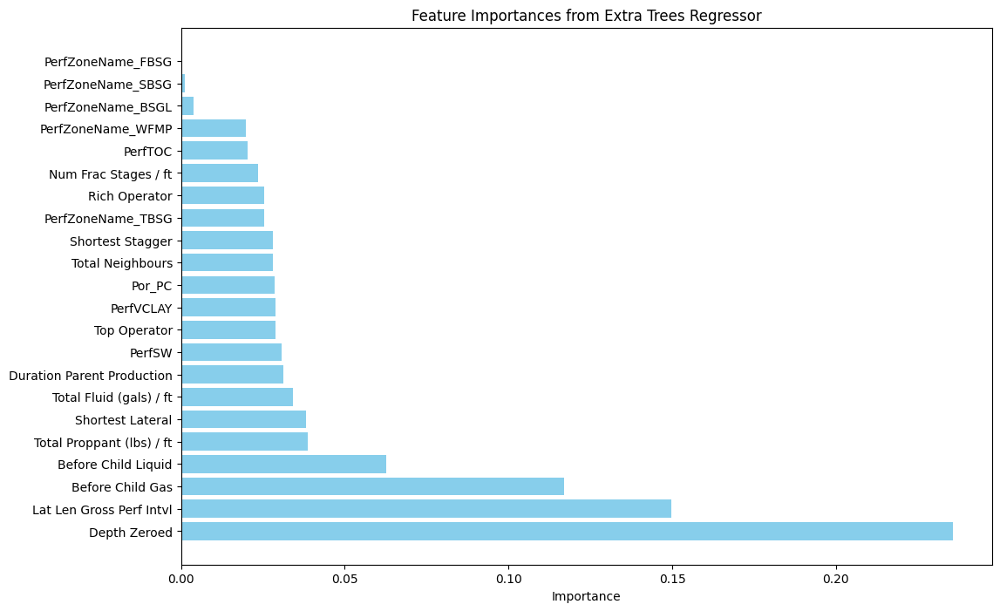

In [28]:
# Get feature importances
feature_importances = model.feature_importances_

# Create a DataFrame for easier plotting
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance')

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importances from Extra Trees Regressor')
plt.gca().invert_yaxis()  # Highest importance on top
plt.show()

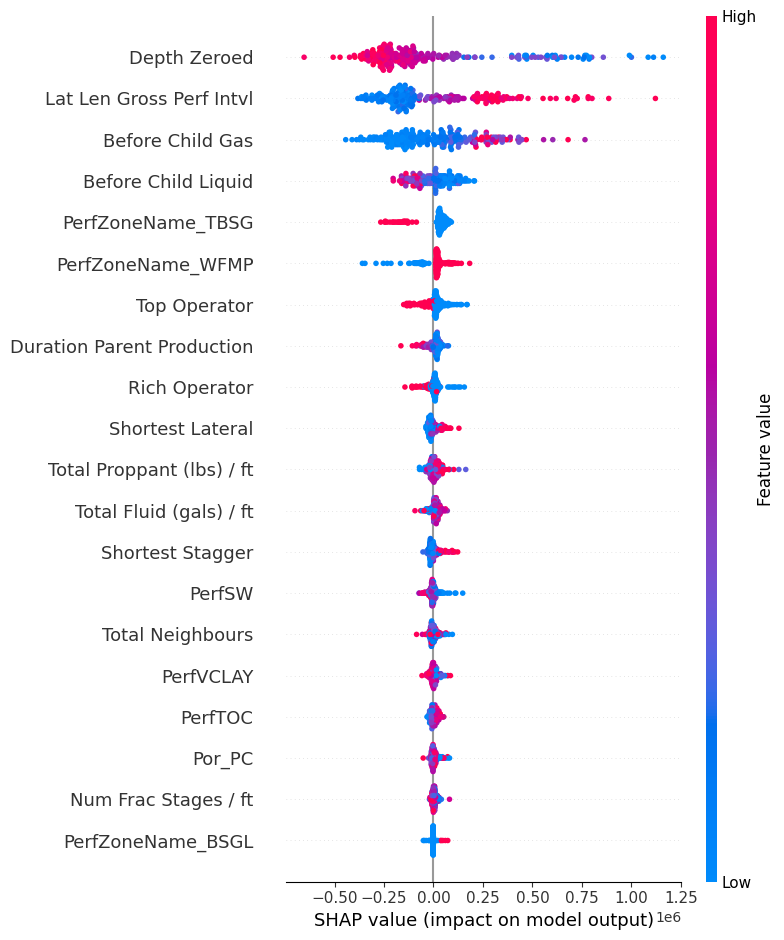

In [31]:
explainer = shap.TreeExplainer(model)

# Compute SHAP values
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values
shap.summary_plot(shap_values, X_test)

In [32]:
geology_parameters = ['Depth Zeroed', 'PerfZoneName_TBSG', 'PerfZoneName_WFMP', 'PerfSW', 'PerfVCLAY', 'PerfTOC', 'Por_PC', 'PerfZoneName_BSGL']
completion_parameters = ['Lat Len Gross Perf Intvl', 'Shortest Lateral', 'Shortest Stagger', 'Num Frac Stages / ft']
parent_child_parameters = ['Before Child Gas', 'Before Child Liquid', 'Duration Parent Production', 'Total Neighbours']
operator_parameters = ['Top Operator', 'Rich Operator']

In [58]:
features = list(X_test.columns)
indices = [index for index, item in enumerate(features) if item in geology_parameters]
geo_shap_df = pd.DataFrame()
for i in indices:
    feature = features[i]
    feature_shap_vals = shap_values[:, i]
    geo_shap_df[feature] = feature_shap_vals
geo_shap_df['Connection'] = list(X_test['Por_PC'])

In [59]:
geo_pos_df = df[['Por_PC', 'Surface Latitude', 'Surface Longitude']]
geo_pos_df = geo_pos_df.rename(columns={'Por_PC': 'Connection'})
geology_shap_values_df = pd.merge(geo_pos_df, geo_shap_df, how='inner', on='Connection')
geology_shap_values_df.drop(columns=['Connection'], inplace=True)
geology_shap_values_df['Geo_SHAP'] = geology_shap_values_df[geology_parameters].sum(axis=1)

In [65]:
min_val = geology_shap_values_df['Geo_SHAP'].min()
max_val = geology_shap_values_df['Geo_SHAP'].max()

# Normalize the column
geology_shap_values_df['Geo_SHAP_normalized'] = 2 * (geology_shap_values_df['Geo_SHAP'] - min_val) / (max_val - min_val) - 1

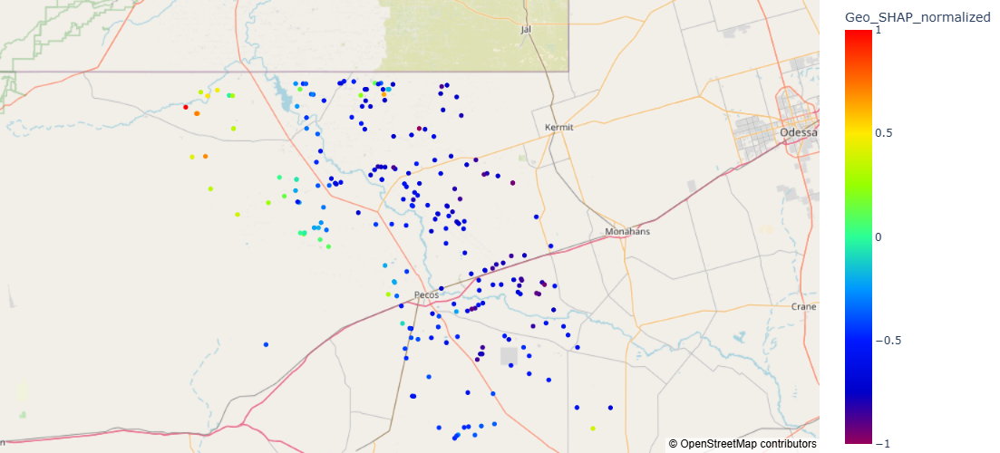

In [67]:
fig = px.scatter_mapbox(geology_shap_values_df,
                        lat='Surface Latitude',
                        lon='Surface Longitude',
                        hover_name='Surface Latitude',
                        hover_data={'Surface Longitude': True},
                        color='Geo_SHAP_normalized',
                        color_continuous_scale=px.colors.sequential.Rainbow,
                        zoom=8,
                        height=500)

# Use an open street map style
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

## Perform K-fold cross validation to develop complete predictions

In [36]:
X = df.drop(columns=['API', 'Operator', f'Liquid_Prod_{n}_Month', f'Liquid_Prod_{n}_Month / ft', f'Gas_Prod_{n}_Month', f'Gas_Prod_{n}_Month / ft', 'Gas_List', 'Before Child Liquid Normalized', 'Before Child Gas Normalized', 'Surface Latitude', 'Surface Longitude'])
y = df[f'Gas_Prod_{n}_Month']
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Placeholder for predictions
predictions = np.zeros(len(y))
shap_values_array = np.zeros((len(y), X.shape[1]))

In [37]:
%%time
for train_index, test_index in tqdm(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on the test fold
    y_pred = model.predict(X_test)
    
    # Store predictions
    predictions[test_index] = y_pred
    
    # Calculate SHAP values
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test)
    
    if isinstance(shap_values, list):
        # Take SHAP values for the first output class (regression should not enter here)
        shap_values_to_use = shap_values[0]
    else:
        shap_values_to_use = shap_values
    
    # Check the shape of the SHAP values
    print(f"SHAP values shape for current fold: {shap_values_to_use.shape}")
    
    # Ensure correct storage of SHAP values
    shap_values_array[test_index, :] = shap_values_to_use

predictions = np.array(predictions)

1it [00:25, 25.28s/it]

SHAP values shape for current fold: (232, 22)


2it [00:50, 25.33s/it]

SHAP values shape for current fold: (231, 22)


3it [01:16, 25.48s/it]

SHAP values shape for current fold: (231, 22)


4it [01:43, 26.26s/it]

SHAP values shape for current fold: (231, 22)


5it [02:09, 25.97s/it]

SHAP values shape for current fold: (231, 22)
CPU times: total: 1min 13s
Wall time: 2min 9s


In [38]:
r2 = r2_score(y, predictions)
mdape = median_absolute_percent_error(y, predictions)
median_squared_error = np.median((y - predictions) ** 2)
rmdse = np.sqrt(median_squared_error)
mape = mean_absolute_percentage_error(y, predictions)

print(f"R^2 Score: {r2:.5f}")
print(f"MDAPE: {mdape:.5f}")
print(f"RMDSE: {rmdse:.5f}")
print(f'MAPE: {mape:.4f}')

R^2 Score: 0.68539
MDAPE: 28.52559
RMDSE: 234236.88547
MAPE: 0.6008


In [82]:
geo_shap_df = pd.DataFrame()
for i in indices:
    feature = features[i]
    feature_shap_vals = shap_values_array[:, i]
    geo_shap_df[feature] = feature_shap_vals
geo_shap_df['Connection'] = list(X['Por_PC'])

geo_pos_df = df[['Por_PC', 'Surface Latitude', 'Surface Longitude']]
geo_pos_df = geo_pos_df.rename(columns={'Por_PC': 'Connection'})
geology_shap_values_df = pd.merge(geo_pos_df, geo_shap_df, how='inner', on='Connection')
geology_shap_values_df.drop(columns=['Connection'], inplace=True)
geology_shap_values_df['Geo_SHAP'] = geology_shap_values_df[geology_parameters].sum(axis=1)
min_val = geology_shap_values_df['Geo_SHAP'].min()
max_val = geology_shap_values_df['Geo_SHAP'].max()

# Normalize the column
geology_shap_values_df['Geo_SHAP_normalized'] = 2 * (geology_shap_values_df['Geo_SHAP'] - min_val) / (max_val - min_val) - 1

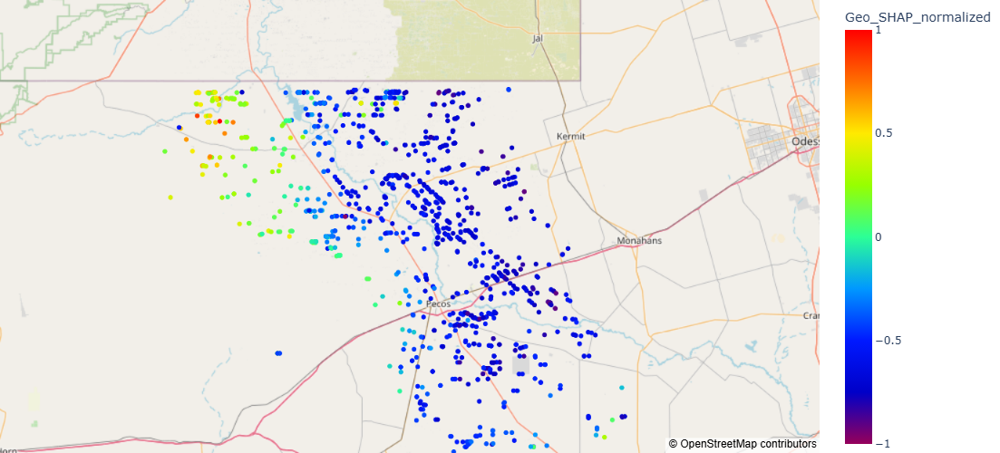

In [83]:
fig = px.scatter_mapbox(geology_shap_values_df,
                        lat='Surface Latitude',
                        lon='Surface Longitude',
                        hover_name='Surface Latitude',
                        hover_data={'Surface Longitude': True},
                        color='Geo_SHAP_normalized',
                        color_continuous_scale=px.colors.sequential.Rainbow,
                        zoom=8,
                        height=500)

# Use an open street map style
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [75]:
geology_shap_values_df = geology_shap_values_df[['Surface Latitude', 'Surface Longitude', 'Geo_SHAP']]

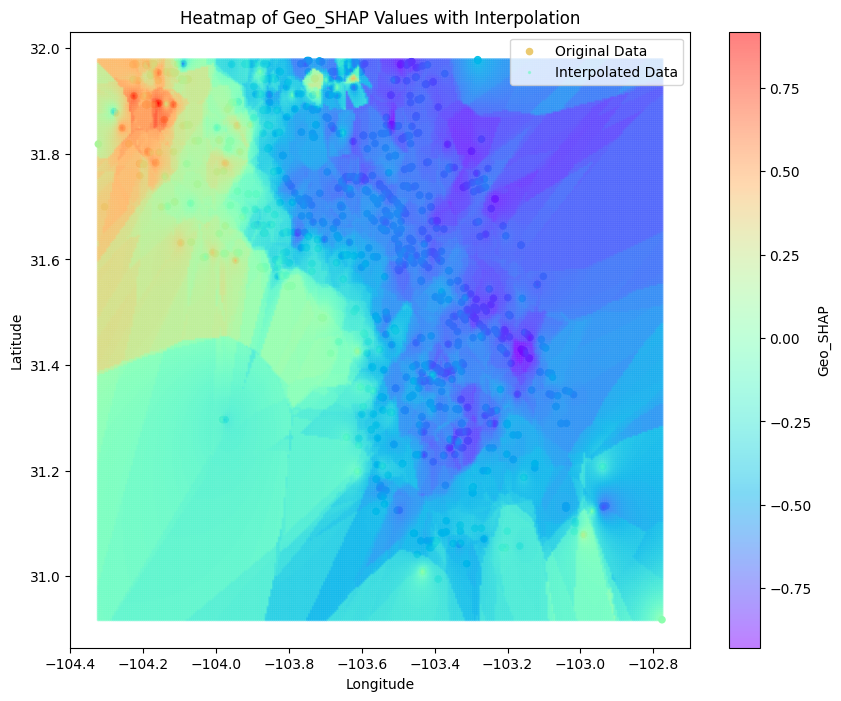

In [96]:
data = geology_shap_values_df
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(data[['Surface Latitude', 'Surface Longitude']], data['Geo_SHAP_normalized'])

# Step 2: Create a grid of points over the map area
lat_min, lat_max = data['Surface Latitude'].min(), data['Surface Latitude'].max()
lon_min, lon_max = data['Surface Longitude'].min(), data['Surface Longitude'].max()

lat_grid, lon_grid = np.meshgrid(
    np.linspace(lat_min, lat_max, 300),  # 200 points for the grid
    np.linspace(lon_min, lon_max, 300)
)
grid_points = np.c_[lat_grid.ravel(), lon_grid.ravel()]

# Step 3: Predict Geo_SHAP values for the grid points
grid_shap_values = knn.predict(grid_points)

# Step 4: Visualize the heatmap
plt.figure(figsize=(10, 8))
plt.scatter(data['Surface Longitude'], data['Surface Latitude'], c=data['Geo_SHAP'], cmap='rainbow', s=20, label='Original Data')

# Interpolated data
plt.scatter(grid_points[:, 1], grid_points[:, 0], c=grid_shap_values, cmap='rainbow', s=2, alpha=0.5, label='Interpolated Data')

plt.colorbar(label='Geo_SHAP')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Heatmap of Geo_SHAP Values with Interpolation')
plt.legend()
plt.show()

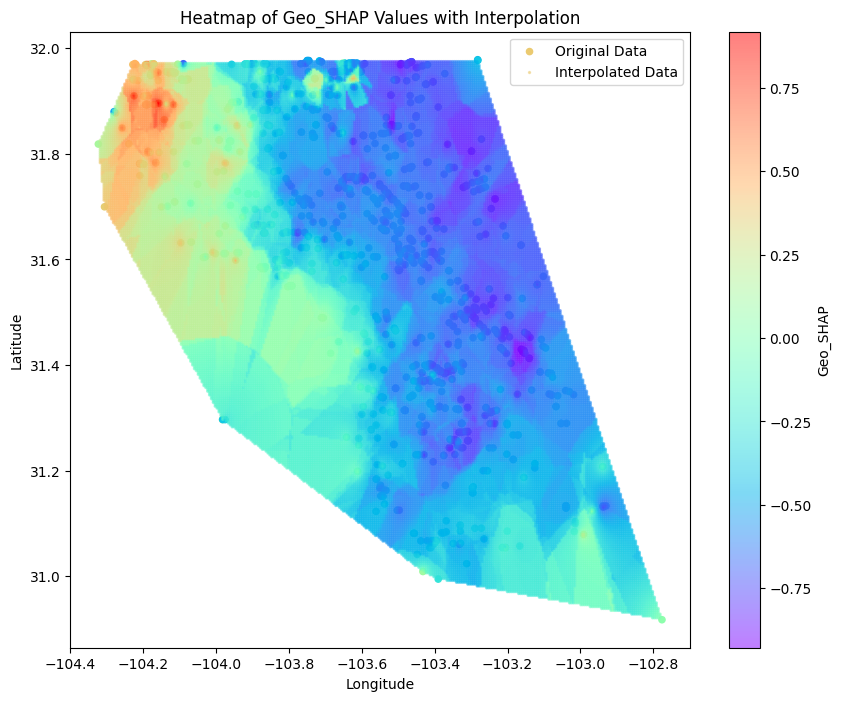

In [97]:
# Step 1: Fit the KNN model
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(data[['Surface Latitude', 'Surface Longitude']], data['Geo_SHAP_normalized'])

# Step 2: Create a grid of points over the map area
lat_min, lat_max = data['Surface Latitude'].min(), data['Surface Latitude'].max()
lon_min, lon_max = data['Surface Longitude'].min(), data['Surface Longitude'].max()

lat_grid, lon_grid = np.meshgrid(
    np.linspace(lat_min, lat_max, 300),
    np.linspace(lon_min, lon_max, 300)
)
grid_points = np.c_[lat_grid.ravel(), lon_grid.ravel()]

# Step 3: Compute the convex hull of the data points to define the boundary
hull = ConvexHull(data[['Surface Longitude', 'Surface Latitude']])
hull_points = data[['Surface Longitude', 'Surface Latitude']].iloc[hull.vertices].values

# Step 4: Create a Delaunay triangulation of the data points
delaunay = Delaunay(data[['Surface Longitude', 'Surface Latitude']])

# Function to check if points are inside the Delaunay triangulation
def is_point_in_triangulation(point, delaunay):
    simplex = delaunay.find_simplex(point)
    return simplex >= 0

# Create a mask to filter grid points within the convex hull
mask = np.array([is_point_in_triangulation([p[1], p[0]], delaunay) for p in grid_points])

# Apply the mask
masked_grid_points = grid_points[mask]

# Step 5: Predict Geo_SHAP values for the masked grid points
grid_shap_values = knn.predict(masked_grid_points)

# Step 6: Visualize the heatmap
plt.figure(figsize=(10, 8))
plt.scatter(data['Surface Longitude'], data['Surface Latitude'], c=data['Geo_SHAP_normalized'], cmap='rainbow', s=20, label='Original Data')

# Interpolated data
plt.scatter(masked_grid_points[:, 1], masked_grid_points[:, 0], c=grid_shap_values, cmap='rainbow', s=2, alpha=0.5, label='Interpolated Data')

plt.colorbar(label='Geo_SHAP')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Heatmap of Geo_SHAP Values with Interpolation')
plt.legend()
plt.show()

In [135]:
indices = [index for index, item in enumerate(features) if item in completion_parameters]
completion_shap_df = pd.DataFrame()
for i in indices:
    feature = features[i]
    feature_shap_vals = shap_values_array[:, i]
    completion_shap_df[feature] = feature_shap_vals
completion_shap_df['Connection'] = list(X['Por_PC'])

geo_pos_df = df[['Por_PC', 'Surface Latitude', 'Surface Longitude']]
geo_pos_df = geo_pos_df.rename(columns={'Por_PC': 'Connection'})
completion_shap_df = pd.merge(geo_pos_df, completion_shap_df, how='inner', on='Connection')
completion_shap_df.drop(columns=['Connection'], inplace=True)
completion_shap_df['Comp_SHAP'] = completion_shap_df[completion_parameters].sum(axis=1)

min_val = completion_shap_df['Comp_SHAP'].min()
max_val = completion_shap_df['Comp_SHAP'].max()

# Normalize the column
completion_shap_df['Comp_SHAP_normalized'] = 2 * (completion_shap_df['Comp_SHAP'] - min_val) / (max_val - min_val) - 1

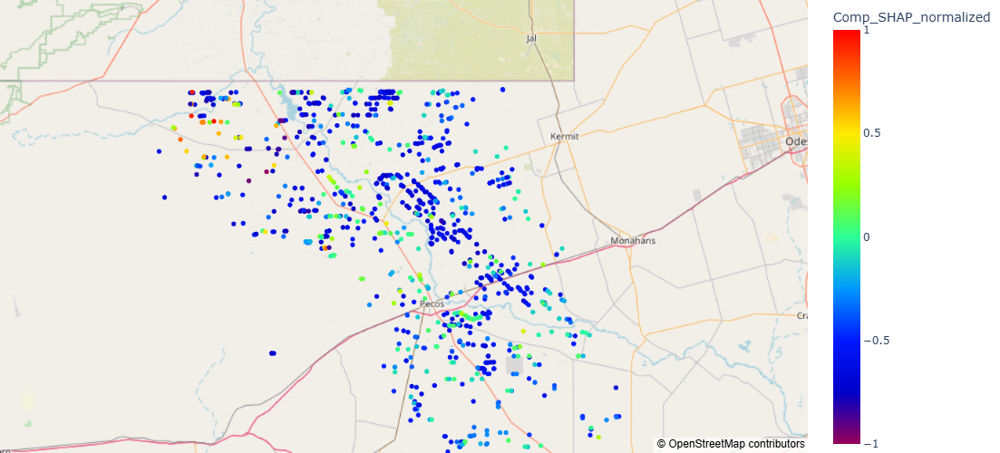

In [136]:
fig = px.scatter_mapbox(completion_shap_df,
                        lat='Surface Latitude',
                        lon='Surface Longitude',
                        hover_name='Surface Latitude',
                        hover_data={'Surface Longitude': True},
                        color='Comp_SHAP_normalized',
                        color_continuous_scale=px.colors.sequential.Rainbow,
                        zoom=8,
                        height=500)

# Use an open street map style
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

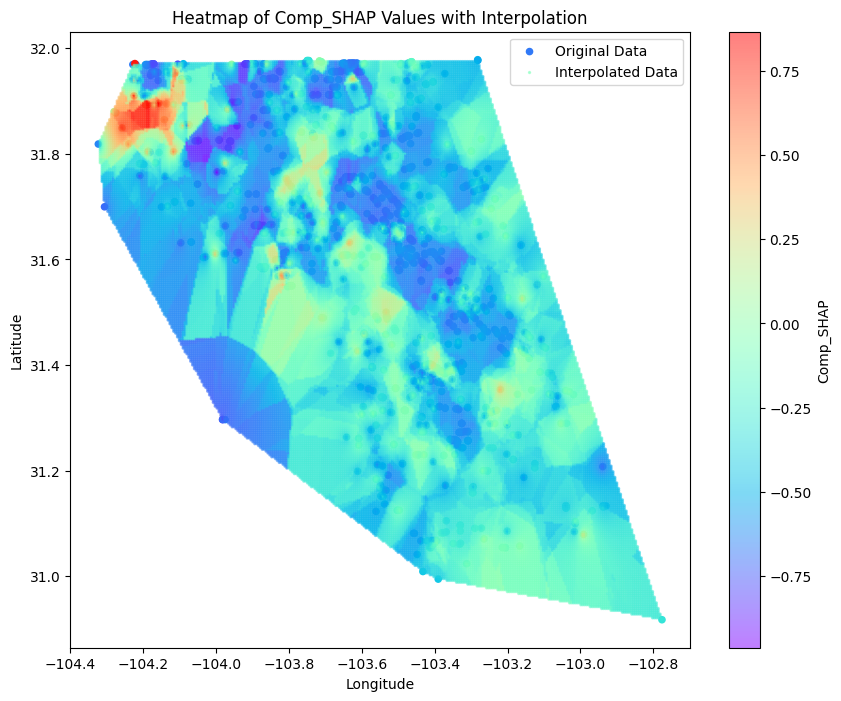

In [137]:
# Step 1: Fit the KNN model
data = completion_shap_df
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(data[['Surface Latitude', 'Surface Longitude']], data['Comp_SHAP_normalized'])

# Step 2: Create a grid of points over the map area
lat_min, lat_max = data['Surface Latitude'].min(), data['Surface Latitude'].max()
lon_min, lon_max = data['Surface Longitude'].min(), data['Surface Longitude'].max()

lat_grid, lon_grid = np.meshgrid(
    np.linspace(lat_min, lat_max, 300),
    np.linspace(lon_min, lon_max, 300)
)
grid_points = np.c_[lat_grid.ravel(), lon_grid.ravel()]

# Step 3: Compute the convex hull of the data points to define the boundary
hull = ConvexHull(data[['Surface Longitude', 'Surface Latitude']])
hull_points = data[['Surface Longitude', 'Surface Latitude']].iloc[hull.vertices].values

# Step 4: Create a Delaunay triangulation of the data points
delaunay = Delaunay(data[['Surface Longitude', 'Surface Latitude']])

# Function to check if points are inside the Delaunay triangulation
def is_point_in_triangulation(point, delaunay):
    simplex = delaunay.find_simplex(point)
    return simplex >= 0

# Create a mask to filter grid points within the convex hull
mask = np.array([is_point_in_triangulation([p[1], p[0]], delaunay) for p in grid_points])

# Apply the mask
masked_grid_points = grid_points[mask]

# Step 5: Predict Geo_SHAP values for the masked grid points
grid_shap_values = knn.predict(masked_grid_points)

# Step 6: Visualize the heatmap
plt.figure(figsize=(10, 8))
plt.scatter(data['Surface Longitude'], data['Surface Latitude'], c=data['Comp_SHAP_normalized'], cmap='rainbow', s=20, label='Original Data')

# Interpolated data
plt.scatter(masked_grid_points[:, 1], masked_grid_points[:, 0], c=grid_shap_values, cmap='rainbow', s=2, alpha=0.5, label='Interpolated Data')

plt.colorbar(label='Comp_SHAP')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Heatmap of Comp_SHAP Values with Interpolation')
plt.legend()
plt.show()

In [138]:
indices = [index for index, item in enumerate(features) if item in parent_child_parameters]
parent_child_shap_df = pd.DataFrame()
for i in indices:
    feature = features[i]
    feature_shap_vals = shap_values_array[:, i]
    parent_child_shap_df[feature] = feature_shap_vals
parent_child_shap_df['Connection'] = list(X['Por_PC'])

geo_pos_df = df[['Por_PC', 'Surface Latitude', 'Surface Longitude']]
geo_pos_df = geo_pos_df.rename(columns={'Por_PC': 'Connection'})
parent_child_shap_df = pd.merge(geo_pos_df, parent_child_shap_df, how='inner', on='Connection')
parent_child_shap_df.drop(columns=['Connection'], inplace=True)
parent_child_shap_df['PCD_SHAP'] = parent_child_shap_df[parent_child_parameters].sum(axis=1)

min_val = parent_child_shap_df['PCD_SHAP'].min()
max_val = parent_child_shap_df['PCD_SHAP'].max()

# Normalize the column
parent_child_shap_df['PCD_SHAP_normalized'] = 2 * (parent_child_shap_df['PCD_SHAP'] - min_val) / (max_val - min_val) - 1

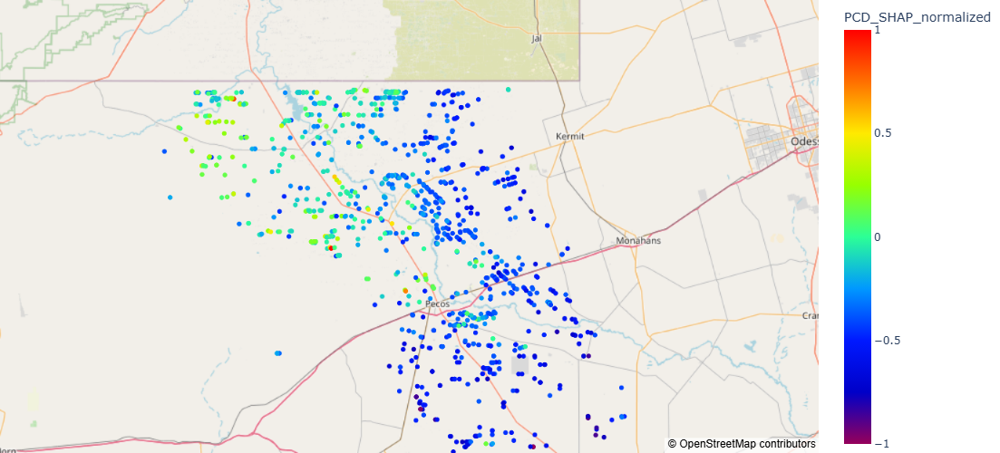

In [140]:
fig = px.scatter_mapbox(parent_child_shap_df,
                        lat='Surface Latitude',
                        lon='Surface Longitude',
                        hover_name='Surface Latitude',
                        hover_data={'Surface Longitude': True},
                        color='PCD_SHAP_normalized',
                        color_continuous_scale=px.colors.sequential.Rainbow,
                        zoom=8,
                        height=500)

# Use an open street map style
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

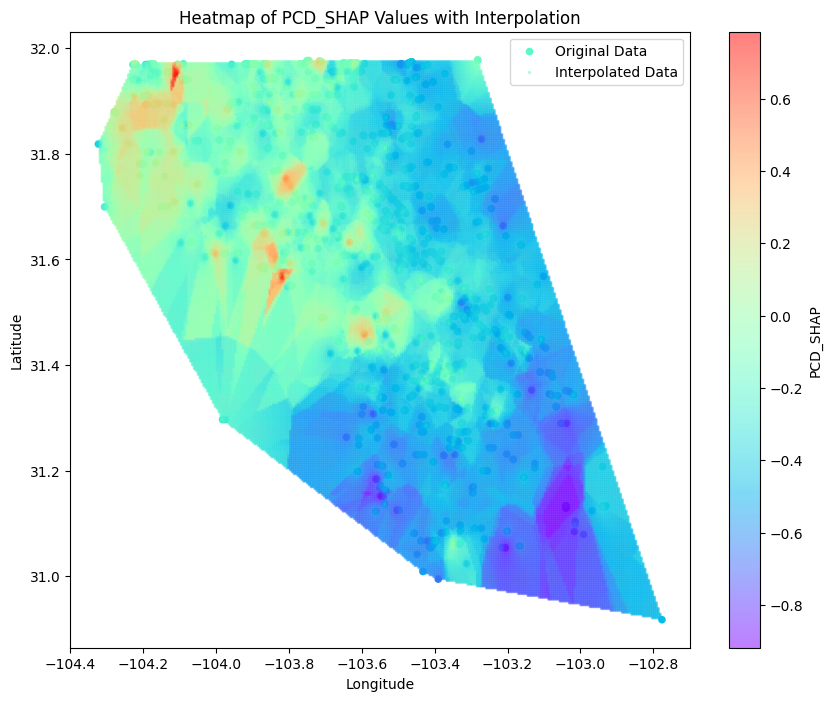

In [141]:
# Step 1: Fit the KNN model
data = parent_child_shap_df
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(data[['Surface Latitude', 'Surface Longitude']], data['PCD_SHAP_normalized'])

# Step 2: Create a grid of points over the map area
lat_min, lat_max = data['Surface Latitude'].min(), data['Surface Latitude'].max()
lon_min, lon_max = data['Surface Longitude'].min(), data['Surface Longitude'].max()

lat_grid, lon_grid = np.meshgrid(
    np.linspace(lat_min, lat_max, 300),
    np.linspace(lon_min, lon_max, 300)
)
grid_points = np.c_[lat_grid.ravel(), lon_grid.ravel()]

# Step 3: Compute the convex hull of the data points to define the boundary
hull = ConvexHull(data[['Surface Longitude', 'Surface Latitude']])
hull_points = data[['Surface Longitude', 'Surface Latitude']].iloc[hull.vertices].values

# Step 4: Create a Delaunay triangulation of the data points
delaunay = Delaunay(data[['Surface Longitude', 'Surface Latitude']])

# Function to check if points are inside the Delaunay triangulation
def is_point_in_triangulation(point, delaunay):
    simplex = delaunay.find_simplex(point)
    return simplex >= 0

# Create a mask to filter grid points within the convex hull
mask = np.array([is_point_in_triangulation([p[1], p[0]], delaunay) for p in grid_points])

# Apply the mask
masked_grid_points = grid_points[mask]

# Step 5: Predict Geo_SHAP values for the masked grid points
grid_shap_values = knn.predict(masked_grid_points)

# Step 6: Visualize the heatmap
plt.figure(figsize=(10, 8))
plt.scatter(data['Surface Longitude'], data['Surface Latitude'], c=data['PCD_SHAP_normalized'], cmap='rainbow', s=20, label='Original Data')

# Interpolated data
plt.scatter(masked_grid_points[:, 1], masked_grid_points[:, 0], c=grid_shap_values, cmap='rainbow', s=2, alpha=0.5, label='Interpolated Data')

plt.colorbar(label='PCD_SHAP')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Heatmap of PCD_SHAP Values with Interpolation')
plt.legend()
plt.show()

In [142]:
indices = [index for index, item in enumerate(features) if item in operator_parameters]
operator_shap_df = pd.DataFrame()
for i in indices:
    feature = features[i]
    feature_shap_vals = shap_values_array[:, i]
    operator_shap_df[feature] = feature_shap_vals
operator_shap_df['Connection'] = list(X['Por_PC'])

geo_pos_df = df[['Por_PC', 'Surface Latitude', 'Surface Longitude']]
geo_pos_df = geo_pos_df.rename(columns={'Por_PC': 'Connection'})
operator_shap_df = pd.merge(geo_pos_df, operator_shap_df, how='inner', on='Connection')
operator_shap_df.drop(columns=['Connection'], inplace=True)
operator_shap_df['Operator_SHAP'] = operator_shap_df[operator_parameters].sum(axis=1)

min_val = operator_shap_df['Operator_SHAP'].min()
max_val = operator_shap_df['Operator_SHAP'].max()

# Normalize the column
operator_shap_df['Operator_SHAP_normalized'] = 2 * (operator_shap_df['Operator_SHAP'] - min_val) / (max_val - min_val) - 1

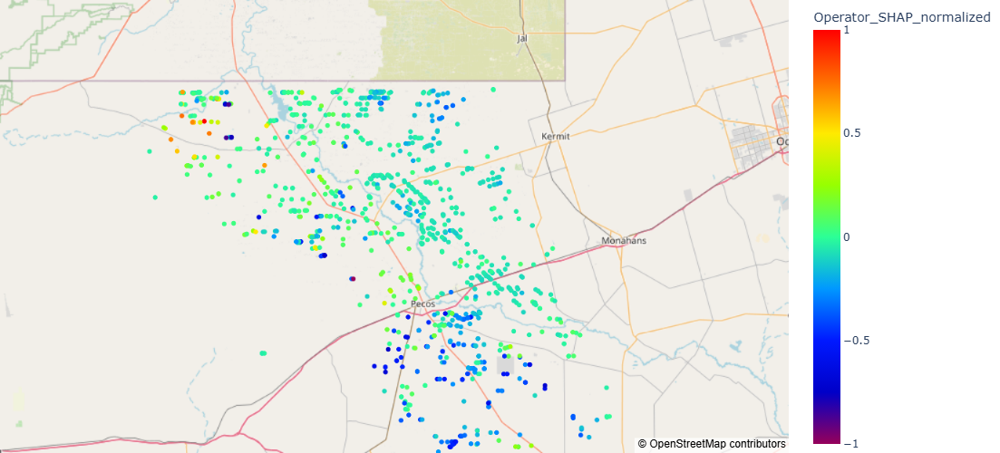

In [148]:
fig = px.scatter_mapbox(operator_shap_df,
                        lat='Surface Latitude',
                        lon='Surface Longitude',
                        hover_name='Surface Latitude',
                        hover_data={'Surface Longitude': True},
                        color='Operator_SHAP_normalized',
                        color_continuous_scale=px.colors.sequential.Rainbow,
                        zoom=8,
                        height=500)

# Use an open street map style
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

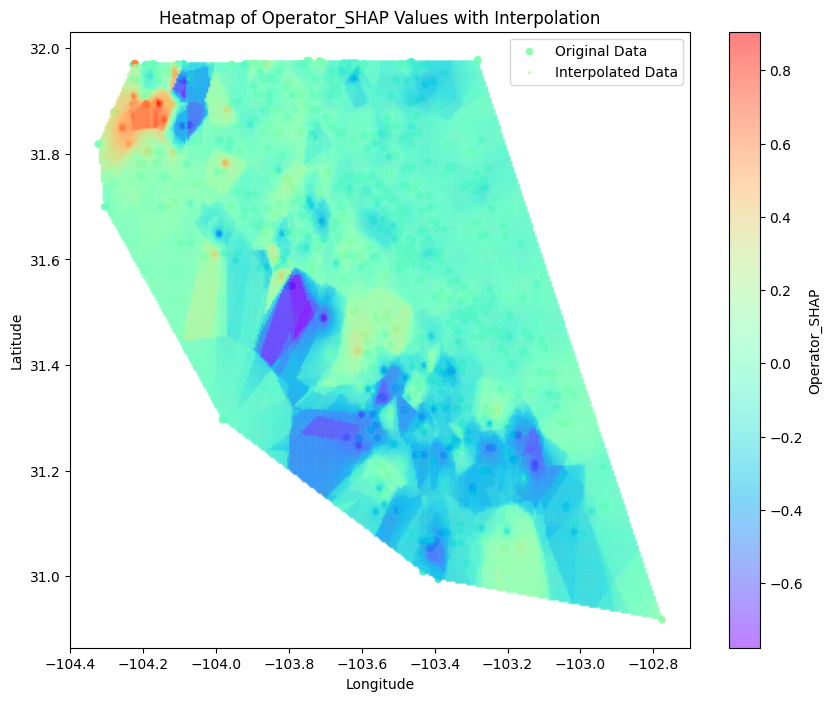

In [145]:
# Step 1: Fit the KNN model
data = operator_shap_df
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(data[['Surface Latitude', 'Surface Longitude']], data['Operator_SHAP_normalized'])

# Step 2: Create a grid of points over the map area
lat_min, lat_max = data['Surface Latitude'].min(), data['Surface Latitude'].max()
lon_min, lon_max = data['Surface Longitude'].min(), data['Surface Longitude'].max()

lat_grid, lon_grid = np.meshgrid(
    np.linspace(lat_min, lat_max, 300),
    np.linspace(lon_min, lon_max, 300)
)
grid_points = np.c_[lat_grid.ravel(), lon_grid.ravel()]

# Step 3: Compute the convex hull of the data points to define the boundary
hull = ConvexHull(data[['Surface Longitude', 'Surface Latitude']])
hull_points = data[['Surface Longitude', 'Surface Latitude']].iloc[hull.vertices].values

# Step 4: Create a Delaunay triangulation of the data points
delaunay = Delaunay(data[['Surface Longitude', 'Surface Latitude']])

# Function to check if points are inside the Delaunay triangulation
def is_point_in_triangulation(point, delaunay):
    simplex = delaunay.find_simplex(point)
    return simplex >= 0

# Create a mask to filter grid points within the convex hull
mask = np.array([is_point_in_triangulation([p[1], p[0]], delaunay) for p in grid_points])

# Apply the mask
masked_grid_points = grid_points[mask]

# Step 5: Predict Geo_SHAP values for the masked grid points
grid_shap_values = knn.predict(masked_grid_points)

# Step 6: Visualize the heatmap
plt.figure(figsize=(10, 8))
plt.scatter(data['Surface Longitude'], data['Surface Latitude'], c=data['Operator_SHAP_normalized'], cmap='rainbow', s=20, label='Original Data')

# Interpolated data
plt.scatter(masked_grid_points[:, 1], masked_grid_points[:, 0], c=grid_shap_values, cmap='rainbow', s=2, alpha=0.5, label='Interpolated Data')

plt.colorbar(label='Operator_SHAP')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Heatmap of Operator_SHAP Values with Interpolation')
plt.legend()
plt.show()

## Total of SHAP Values

In [163]:
final_shap_df = pd.DataFrame()
for i in range(len(X.columns)):
    feature = features[i]
    feature_shap_vals = shap_values_array[:, i]
    final_shap_df[feature] = feature_shap_vals
final_shap_df['Connection'] = list(X['Por_PC'])

geo_pos_df = df[['Por_PC', 'Surface Latitude', 'Surface Longitude']]
geo_pos_df = geo_pos_df.rename(columns={'Por_PC': 'Connection'})
final_shap_df = pd.merge(geo_pos_df, final_shap_df, how='inner', on='Connection')
final_shap_df.drop(columns=['Connection'], inplace=True)
final_shap_df['Final_SHAP'] = final_shap_df.sum(axis=1)

min_val = final_shap_df['Final_SHAP'].min()
max_val = final_shap_df['Final_SHAP'].max()

# Normalize the column
final_shap_df['Final_SHAP_normalized'] = 2 * (final_shap_df['Final_SHAP'] - min_val) / (max_val - min_val) - 1

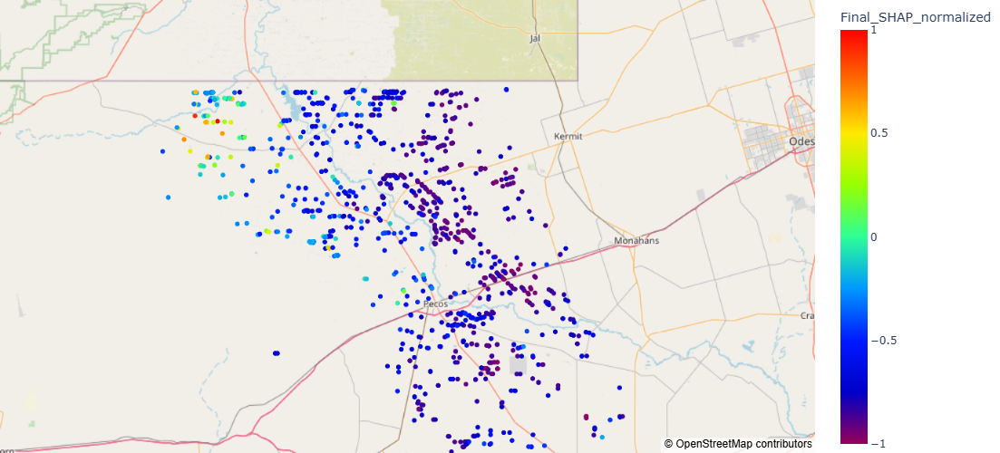

In [165]:
fig = px.scatter_mapbox(final_shap_df,
                        lat='Surface Latitude',
                        lon='Surface Longitude',
                        hover_name='Surface Latitude',
                        hover_data={'Surface Longitude': True},
                        color='Final_SHAP_normalized',
                        color_continuous_scale=px.colors.sequential.Rainbow,
                        zoom=8,
                        height=500)

# Use an open street map style
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

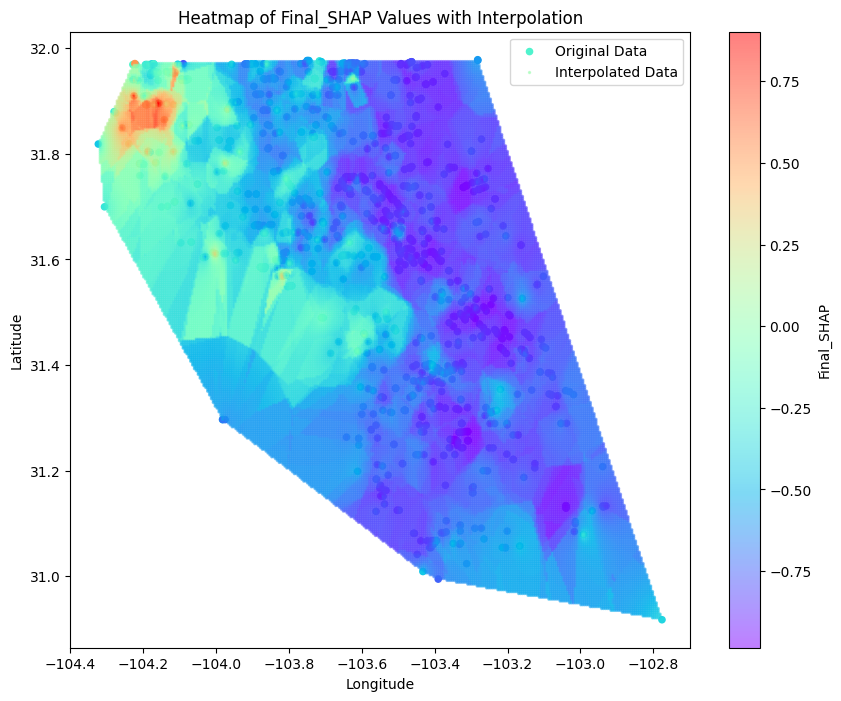

In [166]:
# Step 1: Fit the KNN model
data = final_shap_df
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(data[['Surface Latitude', 'Surface Longitude']], data['Final_SHAP_normalized'])

# Step 2: Create a grid of points over the map area
lat_min, lat_max = data['Surface Latitude'].min(), data['Surface Latitude'].max()
lon_min, lon_max = data['Surface Longitude'].min(), data['Surface Longitude'].max()

lat_grid, lon_grid = np.meshgrid(
    np.linspace(lat_min, lat_max, 300),
    np.linspace(lon_min, lon_max, 300)
)
grid_points = np.c_[lat_grid.ravel(), lon_grid.ravel()]

# Step 3: Compute the convex hull of the data points to define the boundary
hull = ConvexHull(data[['Surface Longitude', 'Surface Latitude']])
hull_points = data[['Surface Longitude', 'Surface Latitude']].iloc[hull.vertices].values

# Step 4: Create a Delaunay triangulation of the data points
delaunay = Delaunay(data[['Surface Longitude', 'Surface Latitude']])

# Function to check if points are inside the Delaunay triangulation
def is_point_in_triangulation(point, delaunay):
    simplex = delaunay.find_simplex(point)
    return simplex >= 0

# Create a mask to filter grid points within the convex hull
mask = np.array([is_point_in_triangulation([p[1], p[0]], delaunay) for p in grid_points])

# Apply the mask
masked_grid_points = grid_points[mask]

# Step 5: Predict Geo_SHAP values for the masked grid points
grid_shap_values = knn.predict(masked_grid_points)

# Step 6: Visualize the heatmap
plt.figure(figsize=(10, 8))
plt.scatter(data['Surface Longitude'], data['Surface Latitude'], c=data['Final_SHAP_normalized'], cmap='rainbow', s=20, label='Original Data')

# Interpolated data
plt.scatter(masked_grid_points[:, 1], masked_grid_points[:, 0], c=grid_shap_values, cmap='rainbow', s=2, alpha=0.5, label='Interpolated Data')

plt.colorbar(label='Final_SHAP')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Heatmap of Final_SHAP Values with Interpolation')
plt.legend()
plt.show()

In [168]:
# Ask a geology professor about potential faults in the region and if interpolation is valid or not
# Normalize by days produced if not using a standard day to predict?